In [1]:
from data_load import *
import matplotlib.pyplot as plt
from utils.file_load_save import *
from utils.data_processing import *
import os
import numpy as np
import glob

In [2]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    SMALL_SIZE = 24
    MEDIUM_SIZE = 24
    BIGGER_SIZE = 24

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    return ax

In [3]:
def solid_marker(radius=13, alpha = 3):
    cycle = np.zeros((2*radius+1,2*radius+1))
    xs, ys = [],[]
    for i in range(-radius, radius+1):
        for j in range(-radius,radius+1):
            if i**2+j**2<=radius**2:
                cycle[i+radius, j +radius] = (np.exp(alpha-alpha*np.sqrt(i**2+j**2)/radius)-1)/(np.exp(alpha)-1)
#                 xs.append(i+radius); ys.append(j+radius)
    return cycle

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(9, 9, 3)


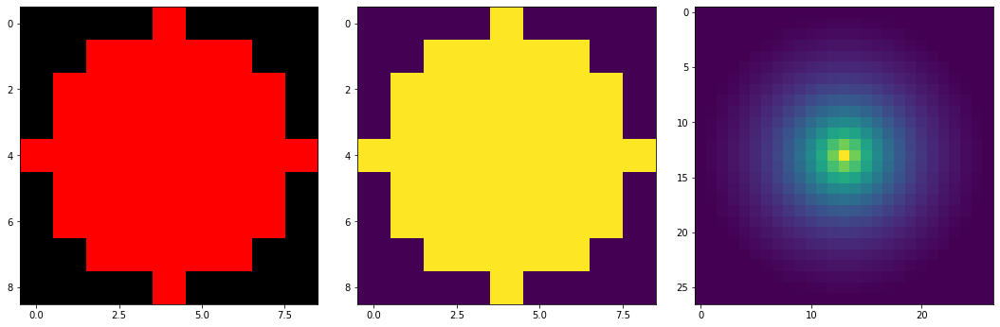

In [4]:
import cv2
# path = '/home/sh38/cell_counting/datasets/mrcnn/bacterial/cross-1/train/000/images/000.png'
# # Reading an image in default mode 
# image = cv2.imread(path) 
import numpy as np
# Radius of circle 
radius = 4
vis = np.zeros((radius*2+1, radius*2+1), np.float32)
vis = cv2.cvtColor(vis, cv2.COLOR_GRAY2BGR)
print(vis.shape)
image = vis
# Window name in which image is displayed 
window_name = 'Image'

# Center coordinates 
center_coordinates = (radius, radius) 
   
# Blue color in BGR 
color = (255, 0, 0) 
   
# Line thickness of 2 px 
thickness = -1
   
# Using cv2.circle() method 
# Draw a circle with blue line borders of thickness of 2 px 
image = cv2.circle(image, center_coordinates, radius, color, thickness) 
   
# Displaying the image  
# cv2.imshow(window_name, image)
ax = get_ax(1,3,5)
ax[0].imshow(image);ax[1].imshow(image[:,:,0]);ax[2].imshow(solid_marker(13,3))

In [7]:
docker = False
val_version=44
if val_version ==44:
    radius = 4
elif val_version ==45:
    radius = 8
elif val_version ==46:
    radius = 5
elif val_version ==47:
    radius = 3

cross_val = 1
normal_proc = False
dataset_root = '/data/datasets' if docker else '../datasets/'
train_data, test_data, train_truths, test_truths = load_train_data(val_version=val_version, cross_val = cross_val)

******** dataset partition summary ******
train:min-0-max-199, test:min-4-max-193
******** data loaded! ******


bone_marrow
45
******** dataset partition summary ******
train:min-1-max-43, test:min-0-max-42
******** data loaded! ******
(600, 600, 3)
255
3.0143781454338994


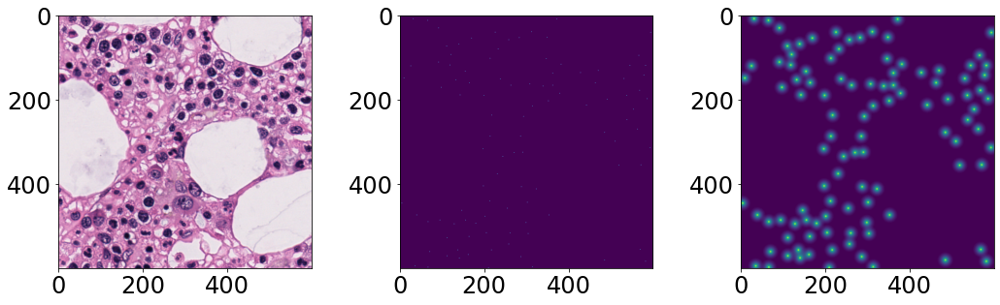

In [10]:
from data_load import *
from scipy import signal

## create folder 
def generate_folder(folder):
    if not os.path.exists(folder):
        os.system('mkdir -p {}'.format(folder))

## create a solid marker 
def solid_marker(radius=13,alpha = 3):
    cycle = np.zeros((2*radius+1,2*radius+1))
    xs, ys = [],[]
    for i in range(-radius, radius+1):
        for j in range(-radius,radius+1):
            if i**2+j**2<=radius**2:
                cycle[i+radius, j +radius] = (np.exp(alpha-alpha*np.sqrt(i**2+j**2)/radius)-1)/(np.exp(alpha)-1)
    return cycle

docker = False
dataset_root = '/data/datasets' if docker else '../datasets/'
method_folder = 'regnet'

# dataset = 'bacterial'
dataset = 'bone_marrow'

if dataset == 'bacterial':
    dataset_id = 44
    radius = 9
elif dataset == 'bone_marrow':
    dataset_id = 45
    radius = 20
elif dataset == 'colorectal':
    dataset_id = 46
    radius = 13
elif dataset == 'hESC':
    dataset_id = 47
    radius = 8

print(dataset);print(dataset_id)
# radius = 13
cycle_object = solid_marker(radius,3)

cross = 1
X_train, X_test, Y_train, Y_test = load_train_data(val_version=dataset_id, cross_val = cross)


subset = 'train'

if subset == 'train':
	X, Y = X_train, Y_train
elif subset == 'test':
	X, Y = X_test, Y_test

cross_folder = 'cross-{}'.format(cross)
subset_folder = os.path.join(dataset_root, method_folder, dataset, cross_folder, subset)
generate_folder(subset_folder)

index = 0
img_id = '{:03d}'.format(index)
data_folder = subset_folder+'/'+img_id
img_folder = data_folder+'/images'; mask_folder = data_folder+'/masks'; dot_folder = data_folder+'/dot'
generate_folder(img_folder); generate_folder(mask_folder); generate_folder(dot_folder)
img = X[index,:,:,:].squeeze(); image = np.uint8((img-img.min())*255./(img.max()-img.min()))
print(image.shape)
dot_map = Y[index,:,:].squeeze()
mask_map = signal.convolve2d(dot_map, cycle_object, boundary='fill', mode='same')*3
# mask_map = np.uint8((mask_map>0)*1.0)
ax = get_ax(rows = 1, cols = 3,size = 5)
ax[0].imshow(image), ax[1].imshow(dot_map); ax[2].imshow(mask_map)
print(image.max()); print(mask_map.max())

../datasets/regnet/bacterial/cross-1/train/images
255
255
1
../datasets/regnet/bone_marrow/cross-1/train/images
255
255
1
../datasets/regnet/colorectal/cross-1/train/images
255
255
1
../datasets/regnet/hESC/cross-1/train/images
255
255
1
(256, 256, 3)
(600, 600, 3)
(500, 500, 3)
(512, 512, 3)


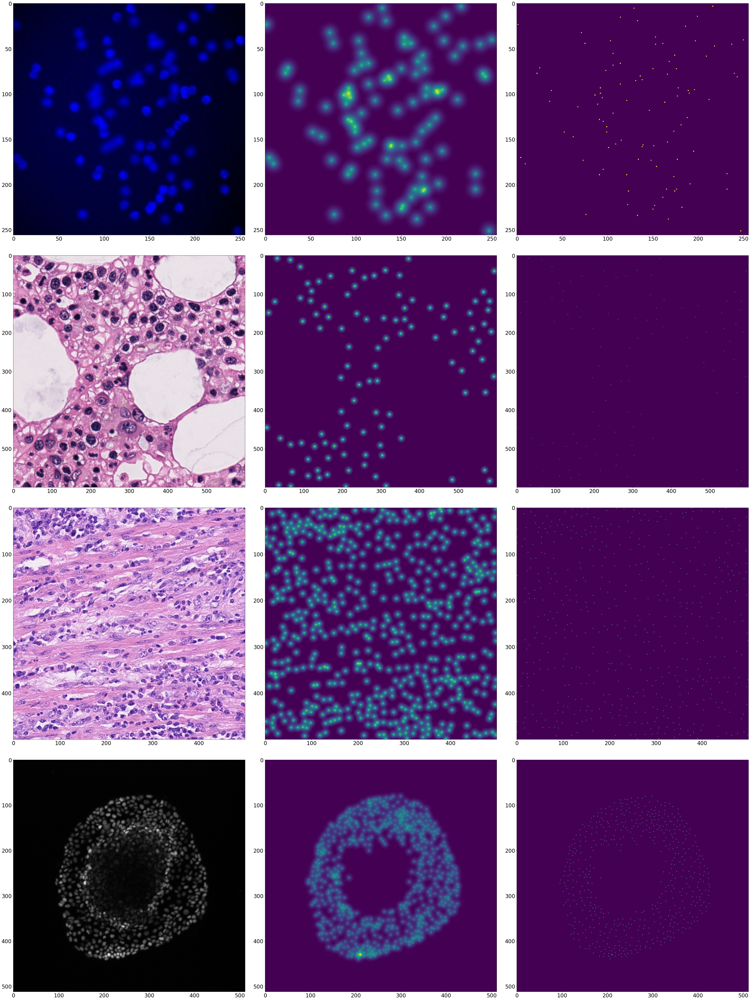

In [32]:
import os
from skimage import io
# check the datset
method_name = 'regnet'
dataset_dir = '../datasets/'
datasets = ['bacterial','bone_marrow','colorectal','hESC']
cross = 1
subset = 'train'
img_list = []; mask_list = []; map_list = []
for dataset in datasets:
    data_folder = os.path.join(dataset_dir,method_name,dataset,'cross-{}'.format(cross), subset)
    img_folder = data_folder+'/images'; mask_folder = data_folder+'/masks'; dot_folder = data_folder+'/dots'; 
    print(img_folder)
    img_fnames = os.listdir(img_folder)
    img_fname = img_fnames[0]
    img = io.imread(img_folder +'/{}'.format(img_fname))
    mask = io.imread(mask_folder +'/{}'.format(img_fname))
    dot_map = io.imread(dot_folder +'/{}'.format(img_fname))
    print(img.max());print(mask.max());print(dot_map.max())
    img_list.append(img); mask_list.append(mask); map_list.append(dot_map)
ax = get_ax(len(img_list), 3)
for i in range(len(img_list)):
    ax[i,0].imshow(img_list[i]); ax[i,1].imshow(mask_list[i]); ax[i,2].imshow(map_list[i])
    print(img_list[i].shape)

255
255


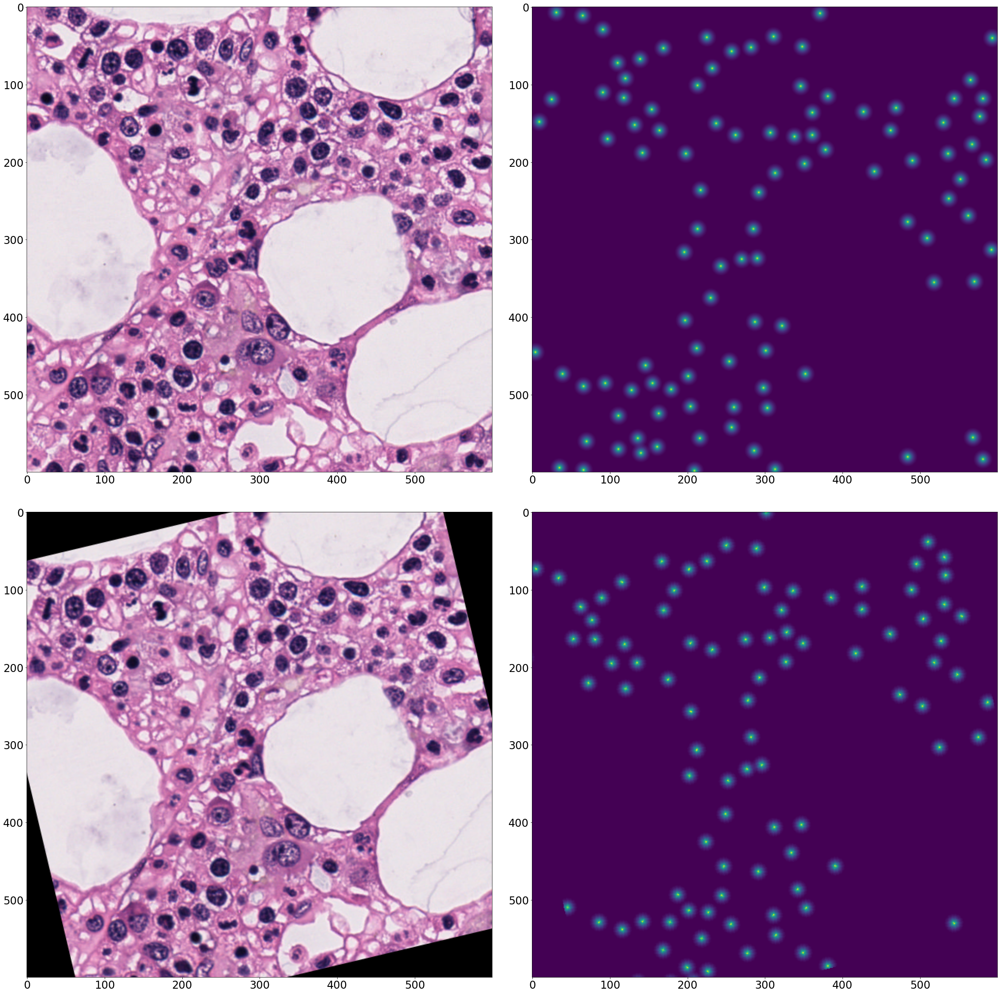

In [60]:
import albumentations as A
# Data augmentation test
ax = get_ax(2, 2)
image = img_list[1]; mask = mask_list[1]; print(mask.max())
ax[0,0].imshow(image); ax[0,1].imshow(mask)
## augmentation: rotate, pad and cropping
dim = 800; crop_dim = 400
train_transform =[
    A.ShiftScaleRotate(scale_limit=0, rotate_limit=20, shift_limit=0, p=1, border_mode=0),
#     A.PadIfNeeded(min_height=dim, min_width=dim, always_apply=True, border_mode=0),
#     A.RandomCrop(height=crop_dim, width=crop_dim, always_apply=True)
]
sample = A.Compose(train_transform)(image =image, mask=mask)
image, mask = sample['image'], sample['mask']
ax[1,0].imshow(image); ax[1,1].imshow(mask)
print(mask.max())